In [2]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from glob import glob

import IPython.display as ipd
from tqdm import tqdm
import subprocess

In [6]:
input_file=r'C:\Users\shubh\New folder\Video_Processing\026c7465-309f6d33.mp4'
subprocess.run([r"C:\Users\shubh\Downloads\ffmpeg-2025-05-29-git-75960ac270-full_build\ffmpeg-2025-05-29-git-75960ac270-full_build\bin\ffmpeg.exe",
                '-i',
                input_file,
                '-qscale',
                '0',
                'video2.mp4',
                '-loglevel',
                'quiet']
              )

CompletedProcess(args=['C:\\Users\\shubh\\Downloads\\ffmpeg-2025-05-29-git-75960ac270-full_build\\ffmpeg-2025-05-29-git-75960ac270-full_build\\bin\\ffmpeg.exe', '-i', 'C:\\Users\\shubh\\New folder\\Video_Processing\\026c7465-309f6d33.mp4', '-qscale', '0', 'video2.mp4', '-loglevel', 'quiet'], returncode=0)

In [9]:
ipd.Video("video2.mp4",width=800)

Open The Video and read Metadata


In [10]:
cap=cv2.VideoCapture("video2.mp4")

In [ ]:
cap.get(cv2.CAP_PROP_FRAME_COUNT) # CAPTURING FRAMERATE OF THE VIDEO

2398.0

In [13]:
#Height and Width of the video
height=cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width=cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f"Height:{height} and Width:{width}")

Height:720.0 and Width:1280.0


In [16]:
#Frame Rate of the video
fps=cap.get(cv2.CAP_PROP_FPS)
print(f"Fps: {fps:0.2f}")

Fps: 59.94


In [17]:
#Release the video after use so that it is no longer used by python
cap.release()

PULLING IN IMAGES FROM VIDEO


In [4]:
cap= cv2.VideoCapture("video2.mp4")
ret,img=cap.read()
print(f"Returned {ret} and img of shape {img.shape}")

Returned True and img of shape (720, 1280, 3)


In [22]:
##Helper function for plotting opencv images in notebook
def display_cv2_image(img,figsize=(10,10)):
    img_=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    fig,ax=plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

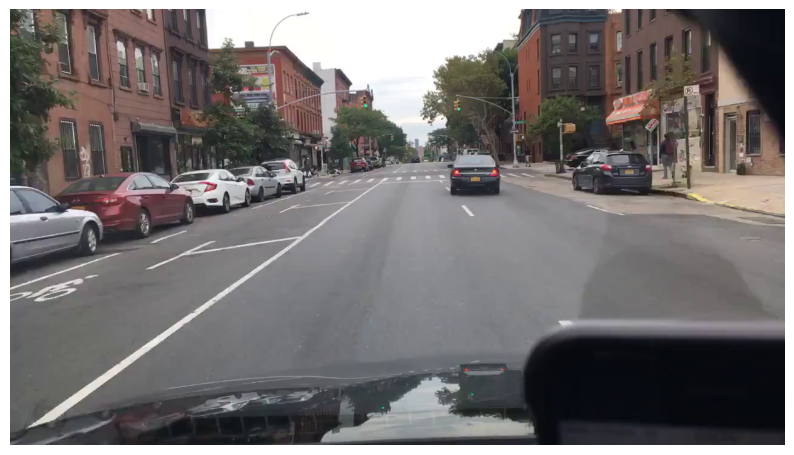

In [25]:
display_cv2_image(img)

In [26]:
cap.release()

DISPLAY MULTIPLE FRAMES

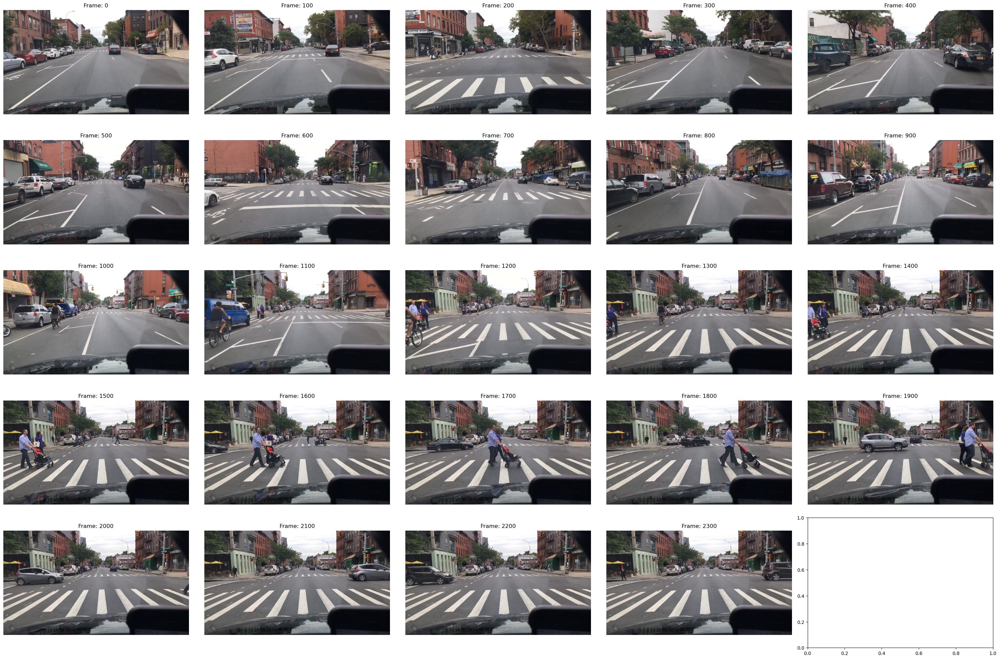

In [28]:
fig,axs=plt.subplots(5,5,figsize=(30,20))
axs=axs.flatten()


cap= cv2.VideoCapture("video2.mp4")
n_frames=int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx=0
for frame in range(n_frames):
    ret,img=cap.read()
    if ret==False:
        break
    if frame%100==0:
        axs[img_idx].imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx+=1
plt.tight_layout()
plt.show()
cap.release()

ADD ANNOTATIONS TO VIDEO IMAGES

In [9]:
import pandas as pd
labels=pd.read_csv(r'C:\Users\shubh\Downloads\mot_labels.csv\mot_labels.csv',low_memory=False)
labels.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
0,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89537.0,car,False,True,False,825.173210,1003.094688,355.011547,418.198614,True
1,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89538.0,car,False,True,False,484.295612,700.461894,346.697460,424.849885,True
2,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89539.0,pedestrian,False,True,False,645.588915,663.879908,338.383372,358.337182,True
3,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89540.0,car,False,False,False,120.969977,192.471132,359.168591,409.053118,True
4,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89541.0,car,False,False,False,251.501155,315.519630,354.180139,400.739030,True


In [16]:
video_labels=(
    labels.query('videoName=="026c7465-309f6d33"').reset_index(drop=True).copy()
)
video_labels["video_frame"]=(video_labels["frameIndex"]*11.9).round().astype("int")
video_labels["category"].value_counts()

category
car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: count, dtype: int64

PULL FRAME 1035


In [20]:
import cv2
cap = cv2.VideoCapture("video2.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()

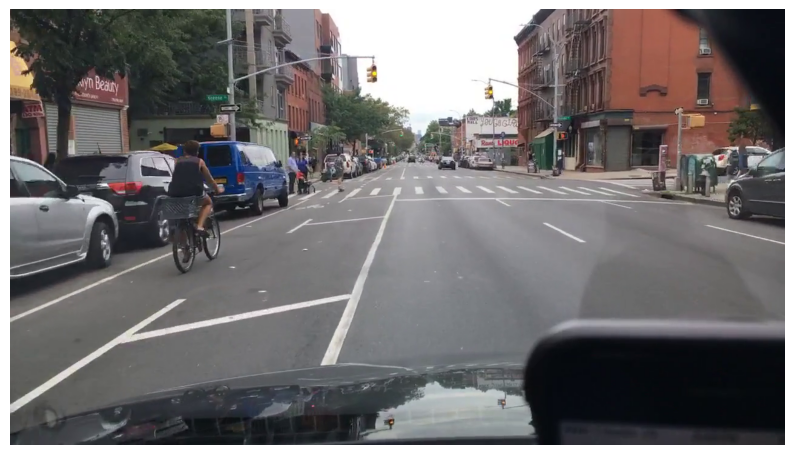

In [25]:
import matplotlib.pyplot as plt
##Helper function for plotting opencv images in notebook
def display_cv2_image(img,figsize=(10,10)):
    img_=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    fig,ax=plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")
display_cv2_image(img)

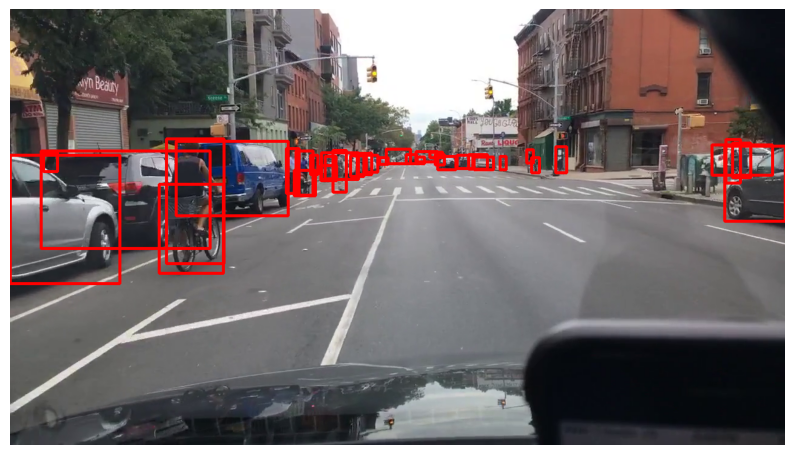

In [29]:

frame_labels=video_labels.query('video_frame==1035')
for i,d in frame_labels.iterrows():
    pt1=int(d['box2d.x1']),int(d['box2d.y1'])
    pt2=int(d['box2d.x2']),int(d['box2d.y2'])
    cv2.rectangle(img,pt1,pt2,(0,0,255),3)
display_cv2_image(img)

In [30]:
d

name                    026c7465-309f6d33-0000088.jpg
videoName                           026c7465-309f6d33
frameIndex                                         87
id                                           107707.0
category                                   pedestrian
attributes.crowd                                False
attributes.occluded                              True
attributes.truncated                            False
box2d.x1                                    55.691207
box2d.x2                                    78.278414
box2d.y1                                   236.627887
box2d.y2                                    268.41729
haveVideo                                        True
video_frame                                      1035
Name: 2110, dtype: object

In [31]:
video_labels["category"].unique()

array(['car', 'truck', 'pedestrian', 'other vehicle', 'rider', 'bicycle',
       'other person', 'trailer', 'motorcycle', 'bus'], dtype=object)

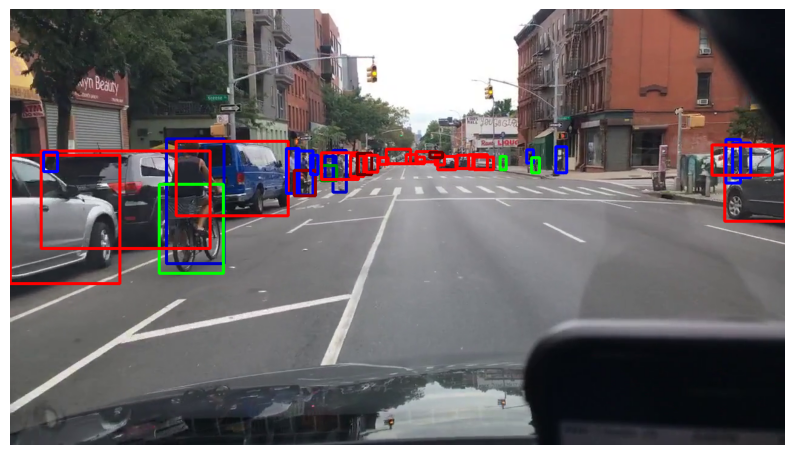

In [33]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 0, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}
img_example=img.copy()
frame_labels=video_labels.query('video_frame==1035')
for i,d in frame_labels.iterrows():
    pt1=int(d['box2d.x1']),int(d['box2d.y1'])
    pt2=int(d['box2d.x2']),int(d['box2d.y2'])
    color=color_map[d['category']]
    cv2.rectangle(img_example,pt1,pt2,color,3)
display_cv2_image(img_example)

ADDING TEXT LABELS


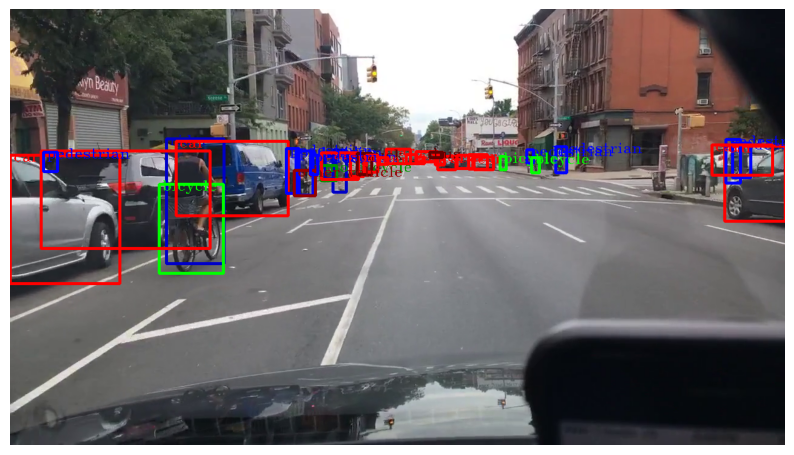

In [36]:
frame_labels = video_labels.query("video_frame == @frame")
font = cv2.FONT_HERSHEY_TRIPLEX
img_example = img.copy()
for i, d in frame_labels.iterrows():
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
    color = color_map[d["category"]]
    img_example = cv2.rectangle(img_example, pt1, pt2, color, 3)
    pt_text = int(d["box2d.x1"]) + 5, int(d["box2d.y1"] + 10)
    img_example = cv2.putText(img_example, d["category"], pt_text, font, 0.75, color)
display_cv2_image(img_example)
cap.release()

In [37]:
cap.release()

LABEL AND OUTPUT ANNOTATED VIDEO


In [40]:
def add_annotations(img, frame, video_labels):
    max_frame = video_labels.query("video_frame <= @frame")["video_frame"].max()
    frame_labels = video_labels.query("video_frame == @max_frame")
    for i, d in frame_labels.iterrows():
        pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
        pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
        color = color_map[d["category"]]
        img = cv2.rectangle(img, pt1, pt2, color, 3)
    return img


from tqdm import tqdm
VIDEO_CODEC= "MP4V"
fps=59.94
width=1280
height=720
out=cv2.VideoWriter("output.mp4",
                cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                fps,
                (width,height))
n_frames=int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

cap=cv2.VideoCapture('video2.mp4')
for frame in tqdm(range(n_frames), total=n_frames):
    ret,img=cap.read()
    if ret==False: 
        break
    img=add_annotations(img,frame,video_labels)
    out.write(img)

out.release()
cap.release()
     

100%|██████████| 2398/2398 [01:16<00:00, 31.50it/s]


In [42]:
import subprocess
tmp_output_path="output.mp4"
output_path="out_test_compressed.mp4"
subprocess.run([r"C:\Users\shubh\Downloads\ffmpeg-2025-05-29-git-75960ac270-full_build\ffmpeg-2025-05-29-git-75960ac270-full_build\bin\ffmpeg.exe",
                '-i',
                tmp_output_path,
                "-crf",
                '18',
                '-preset',
                'veryfast',
                "-vcodec",
                "libx264",
                output_path,
                '-loglevel',
                'quiet'
                ]
              )

CompletedProcess(args=['C:\\Users\\shubh\\Downloads\\ffmpeg-2025-05-29-git-75960ac270-full_build\\ffmpeg-2025-05-29-git-75960ac270-full_build\\bin\\ffmpeg.exe', '-i', 'output.mp4', '-crf', '18', '-preset', 'veryfast', '-vcodec', 'libx264', 'out_test_compressed.mp4', '-loglevel', 'quiet'], returncode=0)

In [46]:
import IPython.display as ipd
ipd.Video('out_test_compressed.mp4',width=900)